# Import library

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd /content/drive/MyDrive/AIA_GP/DATA

/content/drive/MyDrive/AIA_GP/DATA


In [ ]:
import sys
import os

# Get the absolute path to your 'DATA' directory within Google Drive
google_drive_path = '/content/drive/MyDrive/AIA_GP/DATA'

# Append the path to sys.path if it's not already there
if google_drive_path not in sys.path:
    sys.path.append(google_drive_path)
    print(f"Added {google_drive_path} to sys.path")
else:
    print(f"{google_drive_path} is already in sys.path")

import dlmodels  

Added /content/drive/MyDrive/AIA_GP/DATA to sys.path


In [ ]:
import cv2
import os
from cv2 import imread
from cv2 import fillPoly
from shapely import wkt
import numpy as np
from shapely.geometry import mapping
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
import tensorflow.keras.models as models
import tensorflow.keras.optimizers as optimizers
import tensorflow.keras.utils as kutils
import sklearn.ensemble
import sklearn.metrics

import os
import json
import pandas as pd
import dlmodels
import random

In [ ]:
pip install rasterio

In [ ]:
import rasterio

In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


# Data pre-processing

We select **Hurricane Mathew** event

## Read image

In [ ]:
# define constants
image_folder = 'train/images'
bulding_folder = 'train/buildings'
labels_folder = 'train/labels'

In [ ]:
pre_image_files = []
post_image_files = []
pre_building_files = []
post_building_files = []

for root, dirs, files in os.walk(image_folder):
    for file in files:
        if ("hurricane-matthew" in file) and ("pre" in file):
            pre_image_files.append(imread(os.path.join(root, file)))
        elif ("hurricane-matthew" in file) and ("post" in file):
            post_image_files.append(imread(os.path.join(root, file)))

for root, dirs, files in os.walk(image_folder):
    for file in files:
        if ("hurricane-matthew" in file) and ("pre" in file):
            pre_building_files.append(imread(os.path.join(root, file)))
        elif ("hurricane-matthew" in file) and ("post" in file):
            post_building_files.append(imread(os.path.join(root, file)))

In [ ]:
print(len(pre_image_files))
print(len(post_image_files))

238
238


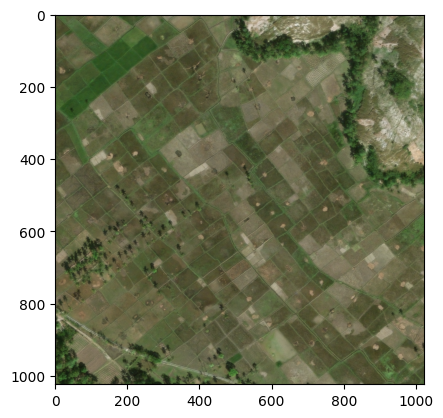

In [ ]:
img = mpimg.imread('train/images/hurricane-matthew_00000013_pre_disaster.png')
imgplot = plt.imshow(img)
plt.show()

## Read polygon and explore data

In [ ]:
count = 0
for root, dirs, files in os.walk(labels_folder):
    for file in files:
        if ("hurricane-matthew" in file) and ("post" in file) and (count==0):
            test = json.load(open(os.path.join(root, file)))
            main_df = pd.json_normalize(test, record_path=['features', 'lng_lat'])
            main_df['image'] = file.split('.')[0]
            count += 1
        elif ("hurricane-matthew" in file) and ("post" in file):
            test = json.load(open(os.path.join(root, file)))
            df = pd.json_normalize(test, record_path=['features', 'lng_lat'])
            df['image'] = file.split('.')[0]
            main_df = pd.concat([main_df, df], ignore_index=True)

In [ ]:
main_df

,wkt,properties.feature_type,properties.subtype,properties.uid,image
0,POLYGON ((-74.13577450837896 18.58417043097835...,building,un-classified,bec77010-647f-415c-b130-602da3cfa87e,hurricane-matthew_00000164_post_disaster
1,POLYGON ((-74.13511241173966 18.58449946976646...,building,major-damage,cdb84082-2bcd-4a8b-9a84-d5ca5fa7344d,hurricane-matthew_00000164_post_disaster
2,POLYGON ((-74.13521889742299 18.58439961643228...,building,minor-damage,4cf3beb0-17d5-4ff2-8386-0dd91521b40a,hurricane-matthew_00000164_post_disaster
3,POLYGON ((-74.13555871237979 18.58450903051159...,building,minor-damage,cc274099-a417-407b-8497-97be6c61a33e,hurricane-matthew_00000164_post_disaster
4,POLYGON ((-74.13547126338656 18.58465537092574...,building,major-damage,1352077f-d5d4-4667-8cbe-5d314a3df6a8,hurricane-matthew_00000164_post_disaster
...,...,...,...,...,...
13934,POLYGON ((-74.13207367081776 18.58599307347137...,building,un-classified,0e5bddd2-e876-478a-87ec-539ac80e41c1,hurricane-matthew_00000167_post_disaster
13935,POLYGON ((-74.12821182555729 18.58712899374828...,building,destroyed,c1874a7f-568c-4a99-a1a1-27aab84b4729,hurricane-matthew_00000167_post_disaster
13936,POLYGON ((-74.12832088976093 18.58705112287775...,building,destroyed,7f9210bd-6e6c-4ddd-a0df-073169f9f16c,hurricane-matthew_00000167_post_disaster
13937,"POLYGON ((-74.12919873856299 18.5877214724216,...",building,destroyed,120e8226-01ce-450c-a11b-640316679057,hurricane-matthew_00000167_post_disaster


In [ ]:
main_df.groupby(['image', 'properties.subtype']).count()

wkt  \
image                                    properties.subtype        
hurricane-matthew_00000000_post_disaster destroyed             3   
                                         major-damage          2   
                                         minor-damage         97   
                                         no-damage             3   
hurricane-matthew_00000001_post_disaster destroyed             1   
...                                                          ...   
hurricane-matthew_00000400_post_disaster destroyed            53   
                                         major-damage         16   
                                         un-classified         1   
hurricane-matthew_00000401_post_disaster destroyed            77   
                                         major-damage          7   

                                                             properties.feature_type  \
image                                    properties.subtype                            
hurricane-matthew_00000000_post_disaster destroyed                                 3   
                                         major-damage                              2   
                                         minor-damage                             97   
                                         no-damage                                 3   
hurricane-matthew_00000001_post_disaster destroyed                                 1   
...                                                                              ...   
hurricane-matthew_00000400_post_disaster destroyed                                53   
                                         major-damage                             16   
                                         un-classified                             1   
hurricane-matthew_00000401_post_disaster destroyed                                77   
                                         major-damage                              7   

                                                             properties.uid  
image                                    properties.subtype                  
hurricane-matthew_00000000_post_disaster destroyed                        3  
                                         major-damage                     2  
                                         minor-damage                    97  
                                         no-damage                        3  
hurricane-matthew_00000001_post_disaster destroyed                        1  
...                                                                     ...  
hurricane-matthew_00000400_post_disaster destroyed                       53  
                                         major-damage                    16  
                                         un-classified                    1  
hurricane-matthew_00000401_post_disaster destroyed                       77  
                                         major-damage                     7  

[751 rows x 3 columns]

## Mask Polygon (create ground truth in raster format)

*This step cam be skipped*

In [ ]:
output_path = 'train/mask_polygon'
labels_folder = 'train/labels'

damage_dict = {
    "no-damage": 1,
    "minor-damage": 2,
    "major-damage": 3,
    "destroyed": 4,
    "un-classified": 5
}

for root, dirs, files in os.walk(labels_folder):
    for file in files:
        if ("hurricane-matthew" in file) and ("post" in file):
            polygons = json.load(open(os.path.join(root, file)))
            h = polygons["metadata"]["height"]
            w = polygons["metadata"]["width"]
            mask_img = np.zeros((h, w), np.uint8)
            for feature in polygons['features']['xy']:
                feature_poly = wkt.loads(feature['wkt'])
                coords = list(mapping(feature_poly)['coordinates'][0])
                fillPoly(mask_img, [np.array(coords, np.int32)], damage_dict[feature['properties']['subtype']])
            output_name = file.split('.')[0] + ".png"
            isExist = os.path.exists(output_path)
            if not isExist:
                os.makedirs(output_path)
            cv2.imwrite(os.path.join(output_path, output_name), mask_img)

### Visualize data from mask polygon function

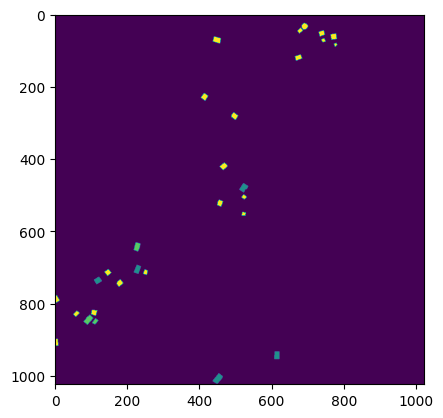

In [ ]:
img = mpimg.imread('train/mask_polygon/hurricane-matthew_00000211_post_disaster.png')
imgplot = plt.imshow(img)
plt.show()

### Visualize data from targets folder

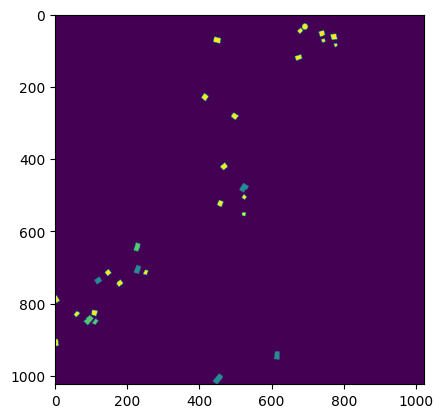

In [ ]:
img = mpimg.imread('train/targets/hurricane-matthew_00000211_post_disaster_target.png')
imgplot = plt.imshow(img)
plt.show()

**Note**

**imread** function from different libraries has different behavior.
- imread function from *cv2*: when it read the image, the shape of data is in 3 dimensions
- imread function from *sklearn*: when it read the image, the shape of data is in 2 dimensions (Based on our understanding, it might happen because when we write the image data, we only specify height and width without specifying 3rd dimension.)

In [ ]:
print(img.shape)

(1024, 1024)


In [ ]:
image = imread('train/images/hurricane-matthew_00000211_post_disaster.png')

In [ ]:
print(image.shape)

(1024, 1024, 3)


In [ ]:
img.shape

(1024, 1024)

In [ ]:
np.sum(img)

79.7451

In [ ]:
output_path = 'test/mask_polygon'
labels_folder = 'test/labels'

damage_dict = {
    "no-damage": 1,
    "minor-damage": 2,
    "major-damage": 3,
    "destroyed": 4,
    "un-classified": 5
}

for root, dirs, files in os.walk(labels_folder):
    for file in files:
        if ("hurricane-matthew" in file) and ("post" in file):
            polygons = json.load(open(os.path.join(root, file)))
            h = polygons["metadata"]["height"]
            w = polygons["metadata"]["width"]
            mask_img = np.zeros((h, w), np.uint8)
            for feature in polygons['features']['xy']:
                feature_poly = wkt.loads(feature['wkt'])
                coords = list(mapping(feature_poly)['coordinates'][0])
                fillPoly(mask_img, [np.array(coords, np.int32)], damage_dict[feature['properties']['subtype']])
            output_name = file.split('.')[0] + ".png"
            isExist = os.path.exists(output_path)
            if not isExist:
                os.makedirs(output_path)
            cv2.imwrite(os.path.join(output_path, output_name), mask_img)

## Prepare image patches

This part of code is modified from Classification of very high resolution satellite images using fully convolutional networks (Slum Segmentation Exercise) developed by Konstantin Maslov.

In [ ]:
# define constants
BANDS_COUNT = 3

PATCH_SIZE = 128
BATCH_SIZE = 4

EPOCHS = 10
STEPS = 700

def read_image(image_path):
    with rasterio.open(image_path) as image_file:
        height, width, depth = image_file.height, image_file.width, image_file.count
        image_arr = np.empty((height, width, depth))
        for band_idx in range(depth):
            band_arr = image_file.read(band_idx + 1)
            image_arr[:, :, band_idx] = band_arr
    return image_arr

def labels_to_onehot(labels_arr, classes_count):
    print(labels_arr.shape)
    height, width, _ = labels_arr.shape
    labels_arr = labels_arr[:, :, 0]
    labels_onehot = np.zeros((height, width, classes_count))
    for class_idx in range(classes_count):
        labels_onehot[:, :, class_idx][labels_arr == class_idx] = 1
    return labels_onehot

I modified TrainSequence and ValSequence function to make it be more dynamic.

Extra arguments
- process: localization (for building localization), classification (for damage classsification)
- classes_count: 2 (for localization task), 6 (for classification task)
- threshold: the number of images that we will use
- image_set: default is 'None' (for damage classification task), pre (for pre-disaster image), post (for post-disaster image)

In [ ]:
class TrainSequence(kutils.Sequence):
    def __init__(self, folder_path, batch_size, patch_size, len, process, classes_count, threshold, image_set='None'):
        self.folder_path = folder_path
        self.batch_size = batch_size
        self.patch_size = patch_size
        self.len = len
        self.process = process
        self.image_set = image_set
        self.classes_count = classes_count
        self.threshold = threshold
        self.read_dataset()
        self.reset()

    def read_dataset(self):
        # print('read dataset')
        self.data = []
        # self.len = 0
        pre_image_files = []
        post_image_files = []
        label_files = []
        count = 0

        # read RGB images
        for root, dirs, files in os.walk(self.folder_path+'/images'):
            # sort the files first to make sure that images are in same order and corresponding with their labels
            files.sort()
            for file in files:
                if ("hurricane-matthew" in file) and ("pre" in file):
                    image = imread(os.path.join(root, file))
                    pre_image_files.append(image)
                    count += 1
                elif ("hurricane-matthew" in file) and ("post" in file):
                    image = imread(os.path.join(root, file))
                    post_image_files.append(image)
                    count += 1
                # stop reading files if the threshold is reached
                if count == self.threshold:
                    break
        count = 0

        # read labels (ground truth)
        if self.process == 'localization':
            for root, dirs, files in os.walk(self.folder_path+'/targets'):
                # sort the files first to make sure that labels are in same order and corresponding with their images
                files.sort()
                for file in files:
                    if self.image_set == 'pre':
                         if ("hurricane-matthew" in file) and ("pre" in file):
                            label = imread(os.path.join(root, file))
                            label = labels_to_onehot(label, self.classes_count)
                            label_files.append(label)
                            count += 1
                    # else:
                    #     if ("hurricane-matthew" in file) and ("post" in file):
                    #         print(file)
                    #         label = imread(os.path.join(root, file))
                    #         label = labels_to_onehot(label, self.classes_count)
                    #         label_files.append(label)
                    #         count += 1
                    # stop reading files if the threshold is reached
                    if count == len(pre_image_files):
                        break
        else:
            # building damage classification task
            for root, dirs, files in os.walk(self.folder_path+'/mask_polygon'):
            # for root, dirs, files in os.walk(self.folder_path+'/targets'):
                # sort the files first to make sure that labels are in same order and corresponding with their images
                files.sort()
                for file in files:
                    # if ("hurricane-matthew" in file) and ("post" in file):
                        label = imread(os.path.join(root, file))
                        label = labels_to_onehot(label, self.classes_count)
                        label_files.append(label)
                        count += 1
                        if count == len(pre_image_files):
                            break

        # append the data to the list
        for i in range(len(label_files)):
            if self.process == 'localization':
                if self.image_set == 'pre':
                    self.data.append((pre_image_files[i], label_files[i]))
                # else:
                #     self.data.append((post_image_files[i], label_files[i]))
            else:
                stacked_images = np.concatenate((pre_image_files[i], post_image_files[i]), axis=2)
                print(stacked_images.shape)
                self.data.append((stacked_images, label_files[i]))


    def __len__(self):
        return self.len

    def __getitem__(self, idx):
        success = False
        if self.process != 'localization':
            BANDS_COUNT = 6
        else:
            BANDS_COUNT = 3
        batch_x = np.empty((self.batch_size, self.patch_size, self.patch_size, BANDS_COUNT))
        batch_y = np.empty((self.batch_size, self.patch_size, self.patch_size, self.classes_count))
        for patch_index in range(self.batch_size):
            while not success:
                image = self.sample_image()
                patch_image, patch_label = self.sample_patch(image)
                if np.sum(np.sum(patch_label, axis=0)[:, 0]) != 16384:
                    success = True
            batch_x[patch_index] = patch_image
            batch_y[patch_index] = patch_label
            success = False
        return batch_x, batch_y

    def sample_image(self):
        if self.image_index >= len(self.data):
            self.reset()
        image, label = self.data[self.image_index]
        return image, label

    def sample_patch(self, image_label_pair):
        image, label = image_label_pair
        height, width, _ = image.shape
        if self.x + self.patch_size > width:
            self.x = 0
            self.y += self.patch_size
        if self.y + self.patch_size > height:
            self.y = 0
            self.x = 0
            self.image_index += 1
            image, label = self.sample_image()

        patch_image = image[self.y:self.y + self.patch_size, self.x:self.x + self.patch_size, :]
        patch_label = label[self.y:self.y + self.patch_size, self.x:self.x + self.patch_size, :]
        self.x += self.patch_size
        return patch_image, patch_label

    def reset(self):
        self.image_index = 0
        self.x = 0
        self.y = 0

For ValSequence class, we don't need to filter out the patches that has no building and we don't need to specify STEPS (len parameter).

In [ ]:
class ValSequence(kutils.Sequence):
    def __init__(self, folder_path, batch_size, patch_size, process, classes_count, threshold, image_set='None'):
        self.folder_path = folder_path
        self.batch_size = batch_size
        self.patch_size = patch_size
        self.process = process
        self.image_set = image_set
        self.classes_count = classes_count
        self.threshold = threshold
        self.read_dataset()
        self.reset()

    def read_dataset(self):
        self.data = []
        self.len = 0
        pre_image_files = []
        post_image_files = []
        label_files = []
        count = 0
        for root, dirs, files in os.walk(self.folder_path+'/images'):
            # sort the files first to make sure that images are in same order and corresponding with their labels
            files.sort()
            for file in files:
                if ("hurricane-matthew" in file) and ("pre" in file):
                    image = imread(os.path.join(root, file))
                    pre_image_files.append(image)
                    count += 1
                elif ("hurricane-matthew" in file) and ("post" in file):
                    image = imread(os.path.join(root, file))
                    post_image_files.append(image)
                    count += 1
                # stop reading files if the threshold is reached
                if count == self.threshold:
                    break

        count = 0
        if self.process == 'localization':
            for root, dirs, files in os.walk(self.folder_path+'/targets'):
                # sort the files first to make sure that labels are in same order and corresponding with their images
                files.sort()
                for file in files:
                    if self.image_set == 'pre':
                         if ("hurricane-matthew" in file) and ("pre" in file):
                            label = imread(os.path.join(root, file))
                            label = labels_to_onehot(label, self.classes_count)
                            label_files.append(label)
                            count += 1
                    # else:
                    #     if ("hurricane-matthew" in file) and ("post" in file):
                    #         label = imread(os.path.join(root, file))
                    #         label = labels_to_onehot(label, self.classes_count)
                    #         label_files.append(label)
                    #         count += 1
                    if count == len(pre_image_files):
                        break
        else:
            for root, dirs, files in os.walk(self.folder_path+'/mask_polygon'):
            # for root, dirs, files in os.walk(self.folder_path+'/targets'):
                # sort the files first to make sure that labels are in same order and corresponding with their images
                files.sort()
                for file in files:
                    # if ("hurricane-matthew" in file) and ("post" in file):
                        label = imread(os.path.join(root, file))
                        label = labels_to_onehot(label, self.classes_count)
                        label_files.append(label)
                        count += 1
                        if count == len(pre_image_files):
                            break

        # append the data to the list
        for i in range(len(label_files)):
            if self.process == 'localization':
                if self.image_set == 'pre':
                    self.data.append((pre_image_files[i], label_files[i]))
                    height, width, _ = pre_image_files[i].shape
                # else:
                #     self.data.append((post_image_files[i], label_files[i]))
                #     height, width, _ = post_image_files[i].shape
                patches_count = (height // self.patch_size) * (width // self.patch_size)
                self.len += patches_count
            else:
                stacked_images = np.concatenate((pre_image_files[i], post_image_files[i]), axis=2)
                print(stacked_images.shape)
                self.data.append((stacked_images, label_files[i]))
                height, width, _ = stacked_images.shape
                patches_count = (height // self.patch_size) * (width // self.patch_size)
                self.len += patches_count

    def __len__(self):
        return self.len

    def __getitem__(self, idx):
        if self.process != 'localization':
            BANDS_COUNT = 6
        else:
            BANDS_COUNT = 3
        #if self.process == 'localization':
        batch_x = np.empty((self.batch_size, self.patch_size, self.patch_size, BANDS_COUNT))
        batch_y = np.empty((self.batch_size, self.patch_size, self.patch_size, self.classes_count))
        for patch_index in range(self.batch_size):
            image = self.sample_image()
            patch_image, patch_label = self.sample_patch(image)
            batch_x[patch_index] = patch_image
            batch_y[patch_index] = patch_label
        return batch_x, batch_y

    def sample_image(self):
        if self.image_index >= len(self.data):
            self.reset()
        image, label = self.data[self.image_index]
        return image, label

    def sample_patch(self, image_label_pair):
        image, label = image_label_pair
        height, width, _ = image.shape
        if self.x + self.patch_size > width:
            self.x = 0
            self.y += self.patch_size
        if self.y + self.patch_size > height:
            self.y = 0
            self.x = 0
            self.image_index += 1
            image, label = self.sample_image()

        patch_image = image[self.y:self.y + self.patch_size, self.x:self.x + self.patch_size, :]
        patch_label = label[self.y:self.y + self.patch_size, self.x:self.x + self.patch_size, :]
        self.x += self.patch_size
        return patch_image, patch_label

    def reset(self):
        self.image_index = 0
        self.x = 0
        self.y = 0

(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)


[]

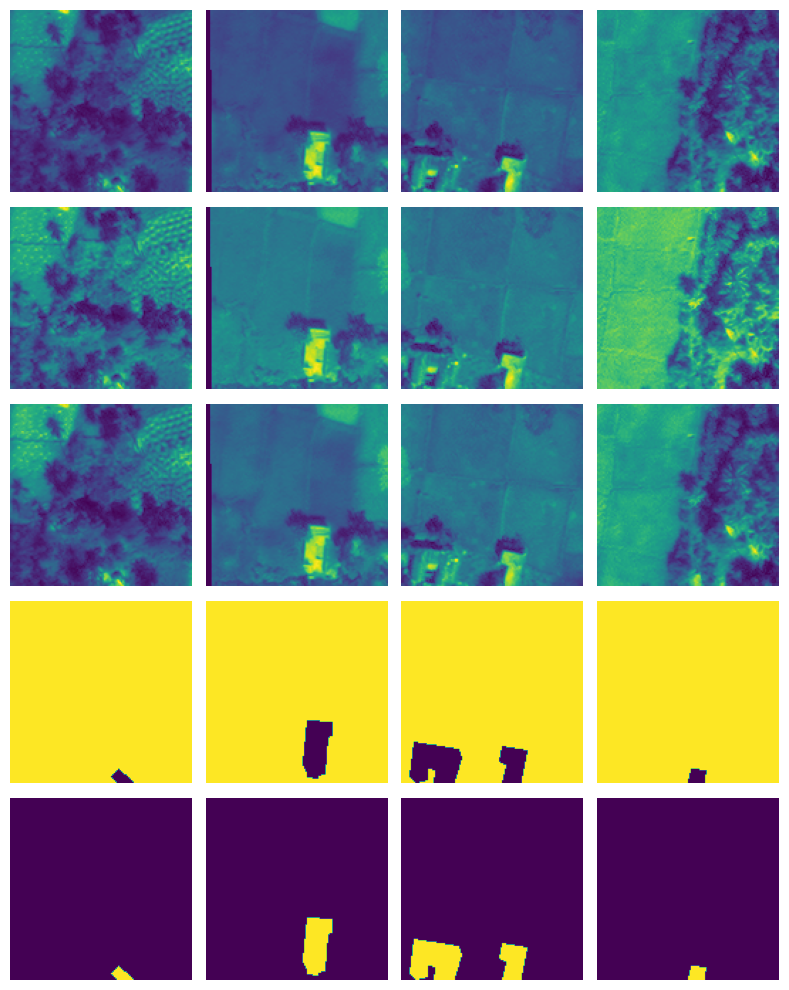

In [ ]:
CLASSES_COUNT = 2
train_sequence = TrainSequence('train', BATCH_SIZE, PATCH_SIZE, STEPS, 'localization', CLASSES_COUNT, 30, 'pre')
# pre_img, post_img, y = train_sequence[0]
img, y = train_sequence[0]
nrows, ncols = BANDS_COUNT + CLASSES_COUNT, BATCH_SIZE
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(2*ncols, 2*nrows))

# for index, (x_item, y_item) in enumerate(zip(pre_img, y)):
for index, (x_item, y_item) in enumerate(zip(img, y)):
    for row in range(BANDS_COUNT):
        axes[row][index].imshow(x_item[:, :, row])
        axes[row][index].axis("off")
    for class_index in range(CLASSES_COUNT):
        row = BANDS_COUNT + class_index
        axes[row][index].imshow(y_item[:, :, class_index], vmin=0, vmax=1)
        axes[row][index].axis("off")

plt.tight_layout()
plt.plot()

(1024, 1024, 3)


[]

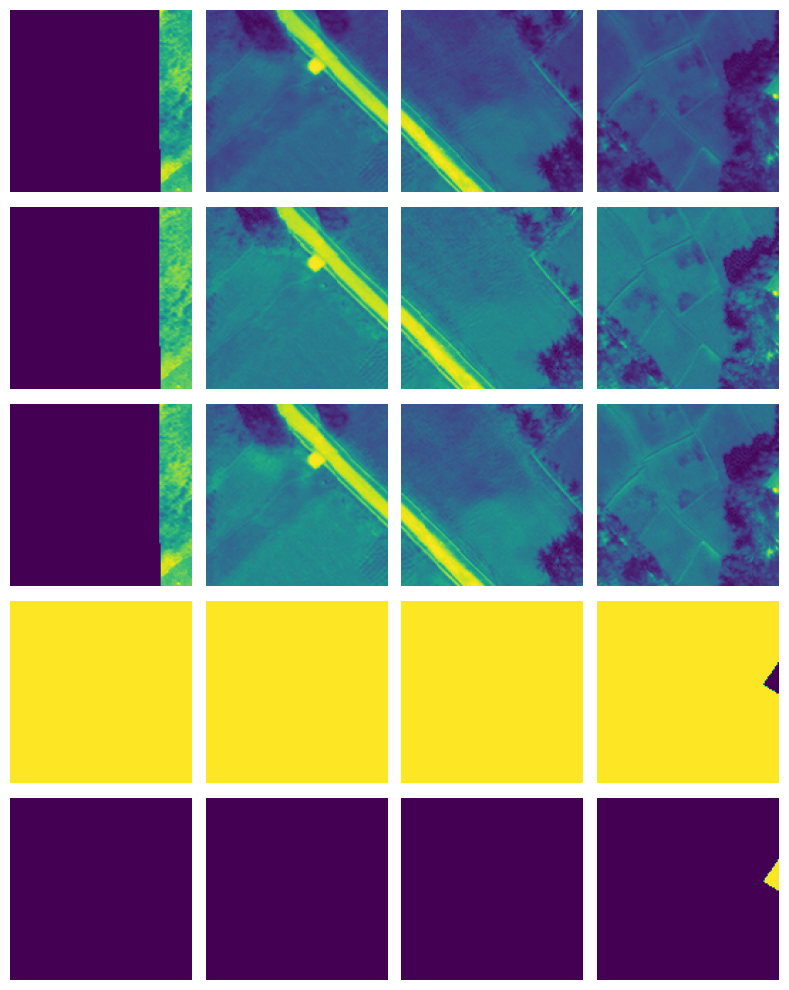

In [ ]:
val_sequence = ValSequence('test', BATCH_SIZE, PATCH_SIZE, 'localization', CLASSES_COUNT, 2, 'pre')
img, y = val_sequence[0]
nrows, ncols = BANDS_COUNT + CLASSES_COUNT, BATCH_SIZE
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(2*ncols, 2*nrows))

# for index, (x_item, y_item) in enumerate(zip(pre_img, y)):
for index, (x_item, y_item) in enumerate(zip(img, y)):
    for row in range(BANDS_COUNT):
        axes[row][index].imshow(x_item[:, :, row])
        axes[row][index].axis("off")
    for class_index in range(CLASSES_COUNT):
        row = BANDS_COUNT + class_index
        axes[row][index].imshow(y_item[:, :, class_index], vmin=0, vmax=1)
        axes[row][index].axis("off")

plt.tight_layout()
plt.plot()

In [ ]:
len(train_sequence)

700

In [ ]:
len(val_sequence)

64

In [ ]:
print(img.shape)
print(y.shape)

(4, 128, 128, 3)
(4, 128, 128, 2)


In [ ]:
# print(pre_img.shape)
# print(post_img.shape)
# print(y.shape)

# Building localization

In [ ]:
def apply_segmentation_with_fcn(image, fcn, patch_size=PATCH_SIZE, step=PATCH_SIZE//2):
    height, width, _ = image.shape
    # padded, (pad_height, pad_width) = pad_image_to_patch_size(image, patch_size)
    # height, width, _ = padded.shape

    predictions = np.zeros((height, width, CLASSES_COUNT))

    row = 0
    while row + patch_size <= height:
        row_patches = []

        col = 0
        while col + patch_size <= width:
            patch = image[row:row + patch_size, col:col + patch_size, :]
            row_patches.append(patch)
            col += step

        batch = np.array(row_patches)
        row_predictions = fcn.predict(batch, verbose=0)

        col, patch_idx = 0, 0
        while col + patch_size <= width:
            predictions[row:row + patch_size, col:col + patch_size, :] += \
                row_predictions[patch_idx]
            col += step
            patch_idx += 1

        row += step

    # predictions = predictions[
    #     height,
    #     width, :
    # ]
    predictions = np.argmax(predictions, axis=-1)

    return predictions

## dk6 with learning rate 10^-3

In [ ]:
model1 = dlmodels.dk6((PATCH_SIZE, PATCH_SIZE, BANDS_COUNT), CLASSES_COUNT)
model1.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/zero_padding2d.py:72: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ zero_padding2d (ZeroPadding2D)       │ (None, 132, 132, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 16)        │           1,216 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128, 128, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 128, 128, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_1 (ZeroPadding2D)     │ (None, 132, 132, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 128, 128, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_2 (ZeroPadding2D)     │ (None, 136, 136, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 128, 128, 32)        │          12,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128, 128, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_3 (ZeroPadding2D)     │ (None, 136, 136, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_4 (ZeroPadding2D)     │ (None, 140, 140, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 128, 128, 32)        │          25,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 128, 128, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_5 (ZeroPadding2D)     │ (None, 140, 140, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ zero_padding2d_6 (ZeroPadding2D)     │ (None, 144, 144, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 128, 128, 32)        │          25,6

 Total params: 117,346 (458.38 KB)

 Trainable params: 116,994 (457.01 KB)

 Non-trainable params: 352 (1.38 KB)

In [ ]:
model1.compile(
    loss="categorical_crossentropy",
    optimizer=optimizers.Adam(learning_rate=1e-2),
    metrics=["accuracy"]
)
EPOCHS = 15
history = model1.fit(
    train_sequence,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_sequence
)

Epoch 1/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 39s 43ms/step - accuracy: 0.9505 - loss: 0.1541 - val_accuracy: 0.9770 - val_loss: 0.1551
Epoch 2/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - accuracy: 0.9615 - loss: 0.0977 - val_accuracy: 0.9794 - val_loss: 0.0518
Epoch 3/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.9728 - loss: 0.0680 - val_accuracy: 0.9788 - val_loss: 0.0793
Epoch 4/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - accuracy: 0.9778 - loss: 0.0547 - val_accuracy: 0.9810 - val_loss: 0.0485
Epoch 5/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 40s 39ms/step - accuracy: 0.9805 - loss: 0.0467 - val_accuracy: 0.9816 - val_loss: 0.0572
Epoch 6/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - accuracy: 0.9829 - loss: 0.0406 - val_accuracy: 0.9705 - val_loss: 0.0813
Epoch 7/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - accuracy: 0.9828 - loss: 0.0416 - val_accuracy: 0.9818 - val_loss: 0.0448
Epoch 8/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step - accuracy: 0.9857 - loss: 0.0339 - 

In [ ]:
# save the weight of the trained network
model1.save_weights("dk6_l2_E15_weights_1.weights.h5")

In [ ]:
len(val_sequence)

64

In [ ]:
len(train_sequence)

700

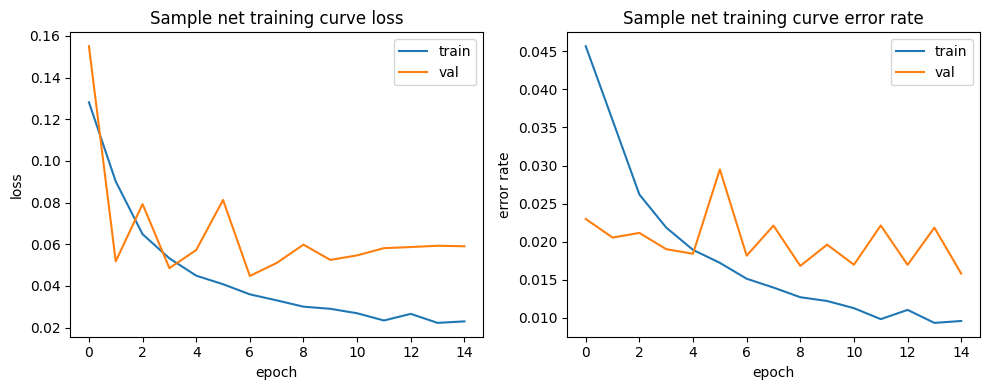

In [ ]:
# plot model training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axs[0].set_title("Sample net training curve loss")
axs[0].plot(history.history["loss"], label="train")
axs[0].plot(history.history["val_loss"], label="val")
axs[0].legend()
axs[0].set_ylabel("loss")
axs[0].set_xlabel("epoch")

axs[1].set_title("Sample net training curve error rate")
axs[1].plot([1 - _ for _ in history.history["accuracy"]], label="train")
axs[1].plot([1 - _ for _ in history.history["val_accuracy"]], label="val")
axs[1].legend()
axs[1].set_ylabel("error rate")
axs[1].set_xlabel("epoch")

plt.tight_layout()
plt.show()

In [ ]:
loss, accuracy = model1.evaluate(val_sequence)
print(f"\nValidation accuracy of dk6: {100 * accuracy:.2f}%")

64/64 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9836 - loss: 0.0625

Validation accuracy of dk6: 98.42%


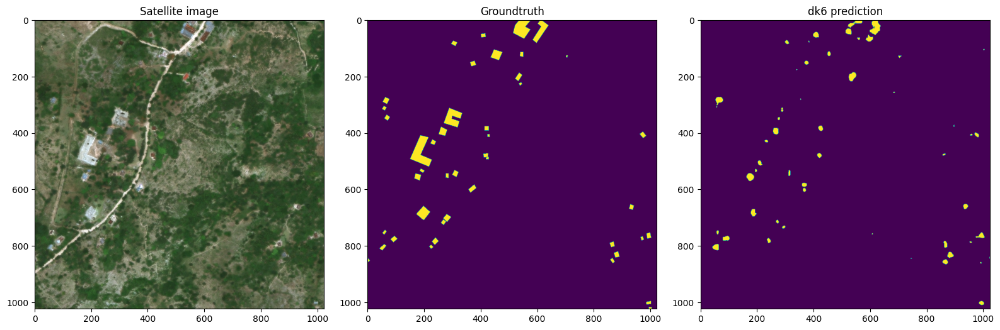

In [ ]:
# let's classify one scene completely and see the results
image_path = 'test/images/hurricane-matthew_00000236_pre_disaster.png'
label_path = 'test/targets/hurricane-matthew_00000236_pre_disaster_target.png'

# image = read_image(image_path)
# label = read_image(label_path)
image = imread(image_path)
label = imread(label_path)

prediction = apply_segmentation_with_fcn(image, model1)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Satellite image")
axs[1].imshow(label[:, :, 0])
axs[1].set_title("Groundtruth")
axs[2].imshow(prediction)
axs[2].set_title("dk6 prediction")

plt.tight_layout()
plt.show()

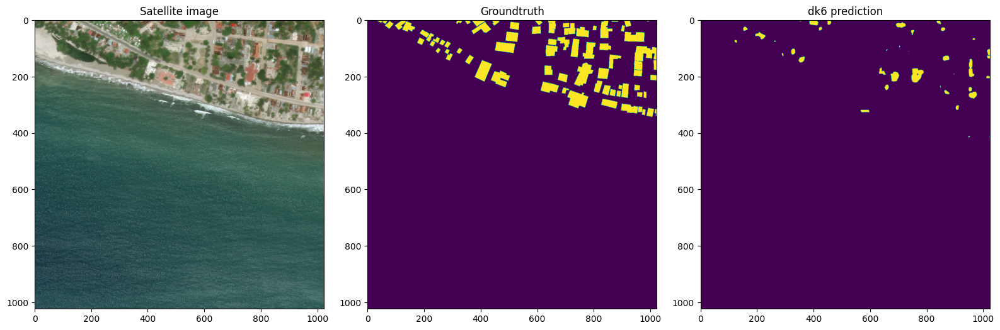

In [ ]:
# let's classify one scene completely and see the results
image_path = 'test/images/hurricane-matthew_00000395_pre_disaster.png'
label_path = 'test/targets/hurricane-matthew_00000395_pre_disaster_target.png'

# image = read_image(image_path)
# label = read_image(label_path)
image = imread(image_path)
label = imread(label_path)

prediction = apply_segmentation_with_fcn(image, model1)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Satellite image")
axs[1].imshow(label[:, :, 0])
axs[1].set_title("Groundtruth")
axs[2].imshow(prediction)
axs[2].set_title("dk6 prediction")

plt.tight_layout()
plt.show()

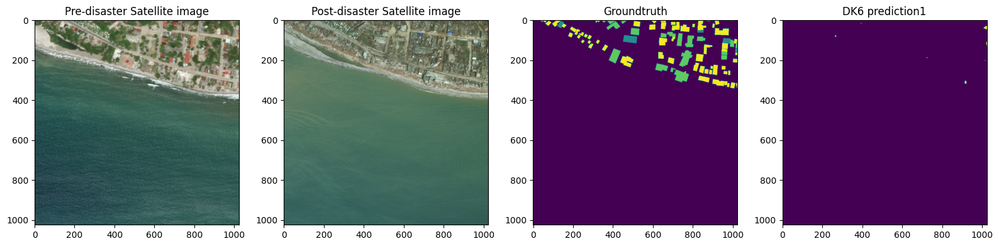

In [ ]:
# let's classify one scene completely and see the results
image_pre_path = 'test/images/hurricane-matthew_00000395_pre_disaster.png'
image_post_path = 'test/images/hurricane-matthew_00000395_post_disaster.png'
label_path = 'test/mask_polygon/hurricane-matthew_00000395_post_disaster.png'

# image = read_image(image_path)
# label = read_image(label_path)
pre_image = imread(image_pre_path)
post_image = imread(image_post_path)
label = imread(label_path)

image = np.concatenate((pre_image, post_image), axis=2)

prediction = apply_segmentation_with_fcn(image, model1)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Pre-disaster Satellite image")
axs[1].imshow(image[:, :, [5, 4, 3]])
axs[1].set_title("Post-disaster Satellite image")
axs[2].imshow(label[:, :, 0])
axs[2].set_title("Groundtruth")
axs[3].imshow(prediction)
axs[3].set_title("DK6 prediction1")

plt.tight_layout()
plt.show()

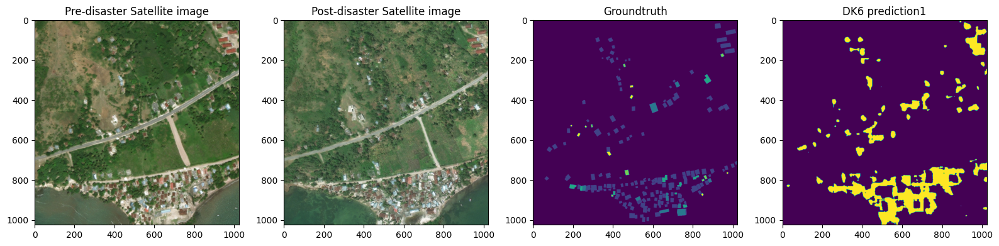

In [ ]:
# let's classify one scene completely and see the results
image_pre_path = 'test/images/hurricane-matthew_00000297_pre_disaster.png'
image_post_path = 'test/images/hurricane-matthew_00000297_post_disaster.png'
label_path = 'test/mask_polygon/hurricane-matthew_00000297_post_disaster.png'

# image = read_image(image_path)
# label = read_image(label_path)
pre_image = imread(image_pre_path)
post_image = imread(image_post_path)
label = imread(label_path)

image = np.concatenate((pre_image, post_image), axis=2)

prediction = apply_segmentation_with_fcn(image, model1)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Pre-disaster Satellite image")
axs[1].imshow(image[:, :, [5, 4, 3]])
axs[1].set_title("Post-disaster Satellite image")
axs[2].imshow(label[:, :, 0])
axs[2].set_title("Groundtruth")
axs[3].imshow(prediction)
axs[3].set_title("DK6 prediction1")

plt.tight_layout()
plt.show()

# Building damage classification

(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)
(1024, 1024, 6)


[]

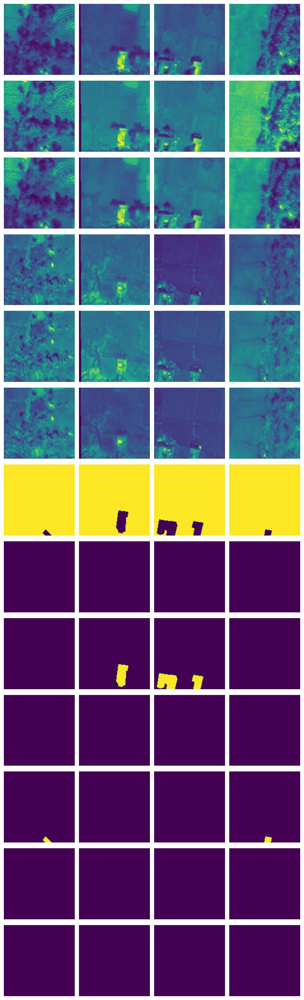

In [32]:
CLASSES_COUNT = 7
BANDS_COUNT = 6
train_sequence = TrainSequence('train', BATCH_SIZE, PATCH_SIZE, STEPS, 'classification', CLASSES_COUNT, 40)
img, y = train_sequence[0]
nrows, ncols = BANDS_COUNT + CLASSES_COUNT, BATCH_SIZE
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(2*ncols, 2*nrows))

# for index, (pre_img_item, post_img_item, y_item) in enumerate(zip(pre_img, post_img, y)):
for index, (x_item, y_item) in enumerate(zip(img, y)):
    for row in range(BANDS_COUNT):
        axes[row][index].imshow(x_item[:, :, row])
        axes[row][index].axis("off")
    for class_index in range(CLASSES_COUNT):
        row = BANDS_COUNT + class_index
        axes[row][index].imshow(y_item[:, :, class_index], vmin=0, vmax=1)
        axes[row][index].axis("off")

plt.tight_layout()
plt.plot()

(1024, 1024, 3)
(1024, 1024, 3)
(1024, 1024, 6)
(1024, 1024, 6)


[]

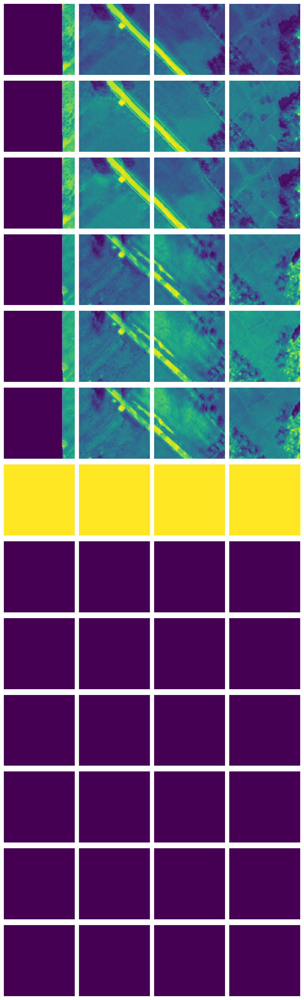

In [33]:
val_sequence = ValSequence('test', BATCH_SIZE, PATCH_SIZE, 'classification', CLASSES_COUNT, 4)
img, y = val_sequence[0]
nrows, ncols = BANDS_COUNT + CLASSES_COUNT, BATCH_SIZE
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(2*ncols, 2*nrows))

for index, (x_item, y_item) in enumerate(zip(img, y)):
# for index, (x_item, y_item) in enumerate(zip(img, y)):
    for row in range(BANDS_COUNT):
        axes[row][index].imshow(x_item[:, :, row])
        axes[row][index].axis("off")
    for class_index in range(CLASSES_COUNT):
        row = BANDS_COUNT + class_index
        axes[row][index].imshow(y_item[:, :, class_index], vmin=0, vmax=1)
        axes[row][index].axis("off")

plt.tight_layout()
plt.plot()

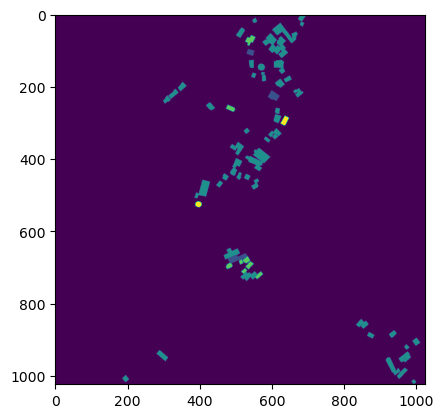

In [34]:
img = imread('test/targets/hurricane-matthew_00000010_post_disaster_target.png')
imgplot = plt.imshow(img[:, :, 0])
plt.show()

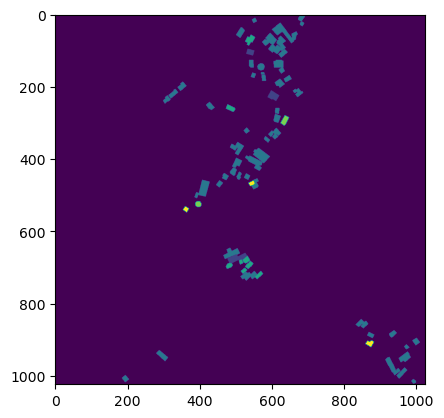

In [35]:
img = imread('test/mask_polygon/hurricane-matthew_00000010_post_disaster.png')
imgplot = plt.imshow(img[:, :, 0])
plt.show()

## Building model using dk6 without localisation

### dk6 with learning rate 0.001 and Epochs 10

In [36]:
model = dlmodels.dk6((PATCH_SIZE, PATCH_SIZE, BANDS_COUNT), CLASSES_COUNT)
model.summary()

c:\Users\ajinp\anaconda3\Lib\site-packages\keras\src\layers\reshaping\zero_padding2d.py:72: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ zero_padding2d (ZeroPadding2D)  │ (None, 132, 132, 6)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 16)   │         2,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_1                │ (None, 132, 132, 16)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_2                │ (None, 136, 136, 16)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 32)   │        12,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_3                │ (None, 136, 136, 32)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_4                │ (None, 140, 140, 32)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 128, 128, 32)   │        25,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_5                │ (None, 140, 140, 32)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_6                │ (None, 144, 144, 32)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 128, 128, 32)   │        25,632 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 118,711 (463.71 KB)

 Trainable params: 118,359 (462.34 KB)

 Non-trainable params: 352 (1.38 KB)

In [41]:
model.compile(
    loss="categorical_crossentropy",
    optimizer=optimizers.Adam(learning_rate=1e-2),
    metrics=["accuracy"]
)

EPOCHS = 10

history = model.fit(
    train_sequence, 
    epochs=EPOCHS, 
    batch_size=BATCH_SIZE, 
    verbose=1, 
    validation_data=val_sequence
)

Epoch 1/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 447s 635ms/step - accuracy: 0.9172 - loss: 0.3115 - val_accuracy: 0.9862 - val_loss: 0.1370
Epoch 2/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 500s 714ms/step - accuracy: 0.9304 - loss: 0.2189 - val_accuracy: 0.9706 - val_loss: 0.1770
Epoch 3/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 502s 717ms/step - accuracy: 0.9382 - loss: 0.1870 - val_accuracy: 0.8976 - val_loss: 0.3878
Epoch 4/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 493s 704ms/step - accuracy: 0.9467 - loss: 0.1576 - val_accuracy: 0.9856 - val_loss: 0.1302
Epoch 5/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 507s 725ms/step - accuracy: 0.9470 - loss: 0.1610 - val_accuracy: 0.9775 - val_loss: 0.1938
Epoch 6/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 505s 722ms/step - accuracy: 0.9556 - loss: 0.1266 - val_accuracy: 0.9839 - val_loss: 0.2009
Epoch 7/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 423s 604ms/step - accuracy: 0.9596 - loss: 0.1113 - val_accuracy: 0.9743 - val_loss: 0.2301
Epoch 8/10
700/700 ━━━━━━━━━━━━━━━━━━━━ 516s 738ms/step - accuracy: 0.9623 -

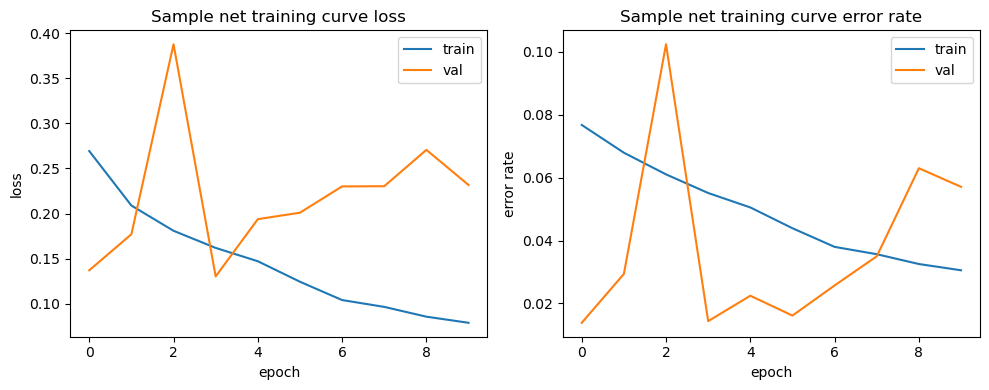

In [42]:
# plot model training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axs[0].set_title("Sample net training curve loss")
axs[0].plot(history.history["loss"], label="train")
axs[0].plot(history.history["val_loss"], label="val")
axs[0].legend()
axs[0].set_ylabel("loss")
axs[0].set_xlabel("epoch")

axs[1].set_title("Sample net training curve error rate")
axs[1].plot([1 - _ for _ in history.history["accuracy"]], label="train")
axs[1].plot([1 - _ for _ in history.history["val_accuracy"]], label="val")
axs[1].legend()
axs[1].set_ylabel("error rate")
axs[1].set_xlabel("epoch")

plt.tight_layout()
plt.show()

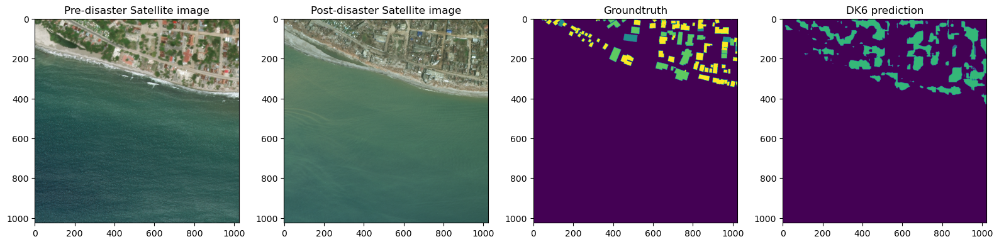

In [44]:
# let's classify one scene completely and see the results
image_pre_path = 'test/images/hurricane-matthew_00000395_pre_disaster.png'
image_post_path = 'test/images/hurricane-matthew_00000395_post_disaster.png'
label_path = 'test/mask_polygon/hurricane-matthew_00000395_post_disaster.png'

# image = read_image(image_path)
# label = read_image(label_path)
pre_image = imread(image_pre_path)
post_image = imread(image_post_path)
label = imread(label_path)

image = np.concatenate((pre_image, post_image), axis=2)

prediction = apply_segmentation_with_fcn(image, model)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Pre-disaster Satellite image")
axs[1].imshow(image[:, :, [5, 4, 3]])
axs[1].set_title("Post-disaster Satellite image")
axs[2].imshow(label[:, :, 0])
axs[2].set_title("Groundtruth")
axs[3].imshow(prediction)
axs[3].set_title("DK6 prediction")

plt.tight_layout()
plt.show()

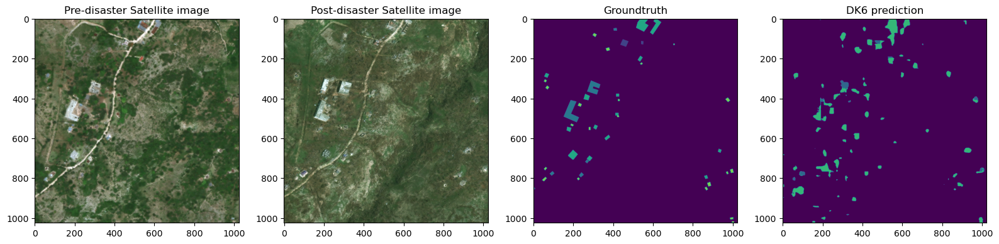

In [45]:
# let's classify one scene completely and see the results
image_pre_path = 'test/images/hurricane-matthew_00000236_pre_disaster.png'
image_post_path = 'test/images/hurricane-matthew_00000236_post_disaster.png'
label_path = 'test/mask_polygon/hurricane-matthew_00000236_post_disaster.png'

# image = read_image(image_path)
# label = read_image(label_path)
pre_image = imread(image_pre_path)
post_image = imread(image_post_path)
label = imread(label_path)

image = np.concatenate((pre_image, post_image), axis=2)

prediction = apply_segmentation_with_fcn(image, model)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Pre-disaster Satellite image")
axs[1].imshow(image[:, :, [5, 4, 3]])
axs[1].set_title("Post-disaster Satellite image")
axs[2].imshow(label[:, :, 0])
axs[2].set_title("Groundtruth")
axs[3].imshow(prediction)
axs[3].set_title("DK6 prediction")

plt.tight_layout()
plt.show()

In [46]:
loss, accuracy = model.evaluate(val_sequence)
print(f"\nValidation accuracy of dk6: {100 * accuracy:.2f}%")

128/128 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - accuracy: 0.9451 - loss: 0.2461

Validation accuracy of dk6: 94.29%


### dk6 with learning rate 0.1 and Epochs 15

In [50]:
model5 = dlmodels.dk6((PATCH_SIZE, PATCH_SIZE, BANDS_COUNT), CLASSES_COUNT)
model5.summary()

c:\Users\ajinp\anaconda3\Lib\site-packages\keras\src\layers\reshaping\zero_padding2d.py:72: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ zero_padding2d_24               │ (None, 132, 132, 6)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 128, 128, 16)   │         2,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_34          │ (None, 128, 128, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_25               │ (None, 132, 132, 16)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_26               │ (None, 136, 136, 16)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (None, 128, 128, 32)   │        12,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_35          │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_27               │ (None, 136, 136, 32)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_28               │ (None, 140, 140, 32)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 128, 128, 32)   │        25,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_36          │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_29               │ (None, 140, 140, 32)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_30               │ (None, 144, 144, 32)   │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 128, 128, 32)   │        25,63

 Total params: 118,711 (463.71 KB)

 Trainable params: 118,359 (462.34 KB)

 Non-trainable params: 352 (1.38 KB)

In [51]:
model5.compile(
    loss="categorical_crossentropy",
    optimizer=optimizers.Adam(learning_rate=1e-1),
    metrics=["accuracy"]
)

EPOCHS = 15

history = model5.fit(
    train_sequence, 
    epochs=EPOCHS, 
    batch_size=BATCH_SIZE, 
    verbose=1, 
    validation_data=val_sequence
)

Epoch 1/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 517s 726ms/step - accuracy: 0.9194 - loss: 0.3534 - val_accuracy: 0.9862 - val_loss: 0.2193
Epoch 2/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 369s 527ms/step - accuracy: 0.9291 - loss: 0.2696 - val_accuracy: 0.9862 - val_loss: 0.1766
Epoch 3/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 331s 473ms/step - accuracy: 0.9246 - loss: 0.2676 - val_accuracy: 0.9764 - val_loss: 0.1787
Epoch 4/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 340s 486ms/step - accuracy: 0.9207 - loss: 0.2763 - val_accuracy: 0.9616 - val_loss: 0.2215
Epoch 5/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 344s 491ms/step - accuracy: 0.9192 - loss: 0.2777 - val_accuracy: 0.6143 - val_loss: 0.9102
Epoch 6/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 342s 489ms/step - accuracy: 0.9246 - loss: 0.2484 - val_accuracy: 0.9862 - val_loss: 0.1358
Epoch 7/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 341s 487ms/step - accuracy: 0.9293 - loss: 0.2337 - val_accuracy: 0.9583 - val_loss: 0.2407
Epoch 8/15
700/700 ━━━━━━━━━━━━━━━━━━━━ 341s 487ms/step - accuracy: 0.9328 -

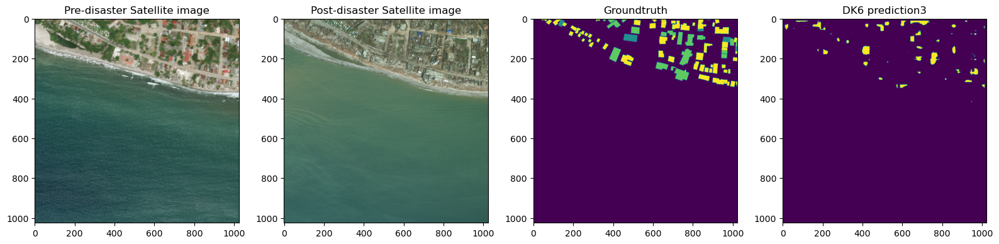

In [52]:
# let's classify one scene completely and see the results
image_pre_path = 'test/images/hurricane-matthew_00000395_pre_disaster.png'
image_post_path = 'test/images/hurricane-matthew_00000395_post_disaster.png'
label_path = 'test/mask_polygon/hurricane-matthew_00000395_post_disaster.png'

# image = read_image(image_path)
# label = read_image(label_path)
pre_image = imread(image_pre_path)
post_image = imread(image_post_path)
label = imread(label_path)

image = np.concatenate((pre_image, post_image), axis=2)

prediction = apply_segmentation_with_fcn(image, model5)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Pre-disaster Satellite image")
axs[1].imshow(image[:, :, [5, 4, 3]])
axs[1].set_title("Post-disaster Satellite image")
axs[2].imshow(label[:, :, 0])
axs[2].set_title("Groundtruth")
axs[3].imshow(prediction)
axs[3].set_title("DK6 prediction3")

plt.tight_layout()
plt.show()

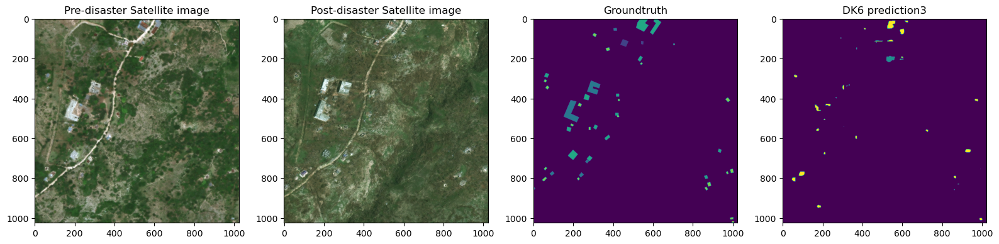

In [54]:
# let's classify one scene completely and see the results
image_pre_path = 'test/images/hurricane-matthew_00000236_pre_disaster.png'
image_post_path = 'test/images/hurricane-matthew_00000236_post_disaster.png'
label_path = 'test/mask_polygon/hurricane-matthew_00000236_post_disaster.png'

# image = read_image(image_path)
# label = read_image(label_path)
pre_image = imread(image_pre_path)
post_image = imread(image_post_path)
label = imread(label_path)

image = np.concatenate((pre_image, post_image), axis=2)

prediction = apply_segmentation_with_fcn(image, model5)

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(16, 7))

axs[0].imshow(image[:, :, [2, 1, 0]])
axs[0].set_title("Pre-disaster Satellite image")
axs[1].imshow(image[:, :, [5, 4, 3]])
axs[1].set_title("Post-disaster Satellite image")
axs[2].imshow(label[:, :, 0])
axs[2].set_title("Groundtruth")
axs[3].imshow(prediction)
axs[3].set_title("DK6 prediction3")

plt.tight_layout()
plt.show()

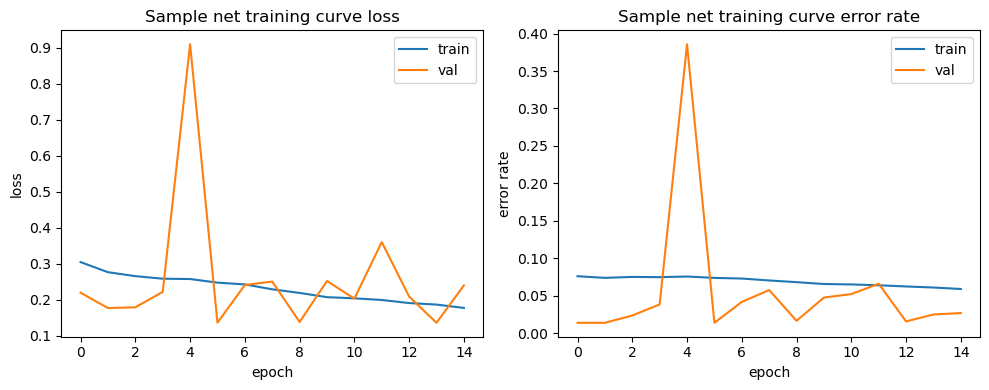

In [55]:
# plot model training history
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

axs[0].set_title("Sample net training curve loss")
axs[0].plot(history.history["loss"], label="train")
axs[0].plot(history.history["val_loss"], label="val")
axs[0].legend()
axs[0].set_ylabel("loss")
axs[0].set_xlabel("epoch")

axs[1].set_title("Sample net training curve error rate")
axs[1].plot([1 - _ for _ in history.history["accuracy"]], label="train")
axs[1].plot([1 - _ for _ in history.history["val_accuracy"]], label="val")
axs[1].legend()
axs[1].set_ylabel("error rate")
axs[1].set_xlabel("epoch")

plt.tight_layout()
plt.show()

In [57]:
loss, accuracy = model5.evaluate(val_sequence)
print(f"\nValidation accuracy of dk6: {100 * accuracy:.2f}%")

128/128 ━━━━━━━━━━━━━━━━━━━━ 23s 178ms/step - accuracy: 0.9687 - loss: 0.3290

Validation accuracy of dk6: 97.31%
